In [1]:
from __future__ import print_function, division # Python 3 printing and division

import pandas as pd
import numpy as np
import seaborn as sns
import os, shutil, glob

# from sklearn.utils.extmath import cartesian
import matplotlib.pyplot as plt
from SALib.sample import saltelli, latin
import pystran

%matplotlib inline

In [55]:
from sklearn import preprocessing

In [2]:
def reshape_files(case_dir,case_name,sim_type,num_scenarios):
    """
    Takes in WEST output files (Steady State.out.txt or Dynamic.out.txt) in a directory (case_dir),
    reads them and arranges them per output variable (instead of per scenario) in a dictionary
    """
    #Initialise everything by reading first file 
    file_name = '%04d'%0 + '_' + case_name + '.' + sim_type + '.' + 'Simul.out.txt'
    output = pd.read_csv(os.path.join(case_dir, file_name), sep='\t')
    result_dict = {k: pd.DataFrame() for k in output.columns}
    result_units = {tag: unit for tag,unit in zip(output.columns,output.loc[0])}
    
    for var_name in result_dict.keys():
        result_dict[var_name]['scen'+'%d'%0] = output[var_name][1:].astype(float)
    
    #Loop over the rest of the files, once per file and once per output variable
    for i in range(1,num_scenarios):
        file_name = '%04d'%i + '_' + case_name + '.' + sim_type + '.' + 'Simul.out.txt'
        output = pd.read_csv(os.path.join(case_dir, file_name), sep='\t')
        for var_name in result_dict.keys():
            previous_data = result_dict[var_name]
            new_data = pd.DataFrame({'scen'+'%d'%i : output[var_name][1:].astype(float)})
            result_dict[var_name] = pd.concat([previous_data,new_data],axis=1)
    
    return result_dict, result_units
    

def run_GSA(scenario, case_dir, case_name, save_dir, experiment_type, timeout_duration):
    scen_id = scenario[0]
    parameter_dict = scenario[1]
    #parameter_dict=dict(zip(parsets2run.columns.values,values))

    scen = py2WEST.WestWrapper(case_dir, case_name, save_dir, scen_id, parameter_dict,
                               experiment_type=experiment_type, timeout=timeout_duration)
    scen.run_west()
    
    #include reshape files function here, so this function is also executed on cluster
    return [scen_id, scen.succes]

In [3]:
def calc_metrics(modelled, observed):

    residuals = np.abs(observed - modelled)
    df = pd.DataFrame({'MAE':np.abs(residuals).mean(axis=0), ### MAE (mean absolute error) range: [0, inf] optimum: 0
                      'RMSE':np.sqrt((residuals**2).mean(axis=0)), ### RMSE (root mean sq error)
                      'MSE':(residuals**2).mean(axis=0), ### MSE (mean sq error) range: [0, inf] optimum: 0
                      'MSLE':((np.log(observed) - np.log(modelled))**2).mean(axis=0), ### MSLE (mean sq log error - emphasises low magnitude errors) range: [0, inf] optimum: 0
                      'RRMSE':np.sqrt((residuals**2).mean(axis=0))/np.mean(observed), ### RRMSE (relative root mean sq error)
                      'SSE':sum(residuals**2), ### SSE (sum of sq errors) range: [0, inf] optimum: 0
                      'AMRE':np.abs((residuals/observed).mean(axis=0)), ### AMRE (abs mean relative error [from MREin pystran]) range: [-inf, inf] optimum: 0
                      'MARE':(np.abs(residuals)/observed).mean(axis=0), ### MARE (mean abs relative error) range: [0, inf] optimum: 0
                      'SARE':(np.abs(residuals)/observed).sum(axis=0), ### SARE (sum of abs relative error) range: [0, inf] optimum: 0
                      'MeAPE':np.median((np.abs(residuals)*100./observed), axis=0), ### MeAPE (median of absolute prediction error) range: [0, inf] optimum: 0
                      'MSRE':((residuals/observed)**2).mean(axis=0), ### MSRE (mean sq relative error) range: [0, inf] optimum: 0
                      'RVE':np.sum(residuals, axis=0)/np.sum(observed, axis=0)} ### RVE (relative vol error) range: [-inf, inf] optimum: 0
                     )
    return df

In [45]:
def reshape_files3(case_dir, case_name, sim_type, num_scenarios, obj):

    """
    Takes in WEST output files (Steady State.out.txt or Dynamic.out.txt) in a directory (case_dir),
    reads them and arranges them per output variable (instead of per scenario) in a dictionary
    
    More efficient memory-wise than reashape_files. It loads in memory only one file at the time 
    and calculates metrics of the chosen objective variables
    
    If sim_type='Steady State' average of the last 100 datapoints
    If sim_type='Dynamic' uses the entire time series output
    ----------
    Parameters
    case_dir: string
    case_name: string
    sim_type: string
    num_scenarios: int
    obj : Pandas DataFrame 
        columns are floats (for 'Steady State') or time series (for 'Dynamic') 
        named as the output variables from WEST
    
    """
    #Initialise everything by reading first file 
    file_name = '%04d'%0 + '_' + case_name + '.' + sim_type + '.' + 'Simul.out.txt'

    output = pd.read_csv(os.path.join(case_dir, file_name), sep='\t')
    result_dict = {k: pd.DataFrame() for k in output.columns}
    result_units = {tag: unit for tag, unit in zip(output.columns, output.loc[0])}
#     out_stst = pd.DataFrame()

    var_name = obj.columns
    #Loop over the files, once per file and for each specified variable
    for i in range(0,num_scenarios):
        file_name = '%04d'%i + '_' + case_name + '.' + sim_type + '.' + 'Simul.out.txt'
        output = pd.read_csv(os.path.join(case_dir, file_name), sep='\t')

        #For steady state files takes the last 100 datapoints to average, for dynamic uses the whole time series
        if sim_type == 'Steady State':
            for v in var_name:
                new_data = calc_metrics3(output[v][-100:].astype(float).mean(), observed=obj[v])
                result_dict[v] = pd.concat([result_dict[v], new_data], axis=0, ignore_index=True)
#                 out_stst = np.append(out_stst, output[v][-100:].astype(float).mean())
                
        if sim_type == 'Dynamic':
            for var_name in result_dict.keys():
                new_data = calc_metrics(output[var_name].astype(float), observed=obj)
                result_dict[var_name] = pd.concat([result_dict[var_name], new_data], axis=1)
        
    return result_dict#, out_stst

def calc_metrics3(modelled, observed):
    """
    Calucates metrics of comparison between modelled and observed variables
    
    -------
    Prameters
    
    modelled: array of floats or time serie
    observed: array of floats or time serie
    """
    
    residuals = np.abs(observed - modelled)
    df = pd.DataFrame({'MAE': np.mean([np.abs(residuals)], axis=0), ### MAE (mean absolute error) range: [0, inf] optimum: 0
                      'RMSE': np.mean([np.sqrt(residuals**2)], axis=0), ### RMSE (root mean sq error)
                      'MSE': np.mean([(residuals**2)], axis=0), ### MSE (mean sq error) range: [0, inf] optimum: 0
                      'MSLE': np.mean([((np.log(observed) - np.log(modelled))**2)], axis=0), ### MSLE (mean sq log error - emphasises low magnitude errors) range: [0, inf] optimum: 0
                      'RRMSE': np.mean([np.sqrt((residuals**2))], axis=0)/np.mean(observed), ### RRMSE (relative root mean sq error)
                      'SSE': np.sum(residuals**2), ### SSE (sum of sq errors) range: [0, inf] optimum: 0
                      'AMRE': np.mean([np.abs(residuals/observed)], axis=0), ### AMRE (abs mean relative error [from MREin pystran]) range: [-inf, inf] optimum: 0
                      'MARE': np.mean([(np.abs(residuals)/observed)], axis=0), ### MARE (mean abs relative error) range: [0, inf] optimum: 0
                      'SARE': (np.abs(residuals)/observed).sum(axis=0), ### SARE (sum of abs relative error) range: [0, inf] optimum: 0
                      'MeAPE': np.median([(np.abs(residuals)*100./observed)], axis=0), ### MeAPE (median of absolute prediction error) range: [0, inf] optimum: 0
                      'MSRE': np.mean([((residuals/observed)**2)], axis=0), ### MSRE (mean sq relative error) range: [0, inf] optimum: 0
                      'RVE': np.sum([residuals], axis=0)/np.sum([observed], axis=0)}, ### RVE (relative vol error) range: [-inf, inf] optimum: 0
                      index=[0])
    return df

# Sample preparation

## SALib param preparation

In [110]:
problem = {
  'num_vars': 14,
  'names': ['K_O_A1Lysis', 'K_O_A2Lysis', 'b_A1',
           'b_A2', 'Y_A1', 'Y_A2',
           'n_NOx_A1_d', 'K_FA', 'K_FNA',
           'K_I9FA', 'K_OA1', 'K_OA2',
           'K_F1', 'K_O1_BH'],
  'bounds': [[0.06, 1.74], [0.151, 0.739], [0.0028, 0.3052],
            [0.0028, 0.3052], [0.14, 0.25], [0.042,  0.258],
            [0.001, 0.8], [0.0006, 0.0054], [0.00000005, 0.000545],
            [0.01, 1.09], [0.38, 0.62], [0.98, 1.22], 
            [2.4, 21.6], [0.12, 1.08]]
}

# Generate samples
param_values = latin.sample(problem, 10000)#, calc_second_order=True)
columns=problem['names'] 

In [111]:
param_values.shape

(10000, 14)

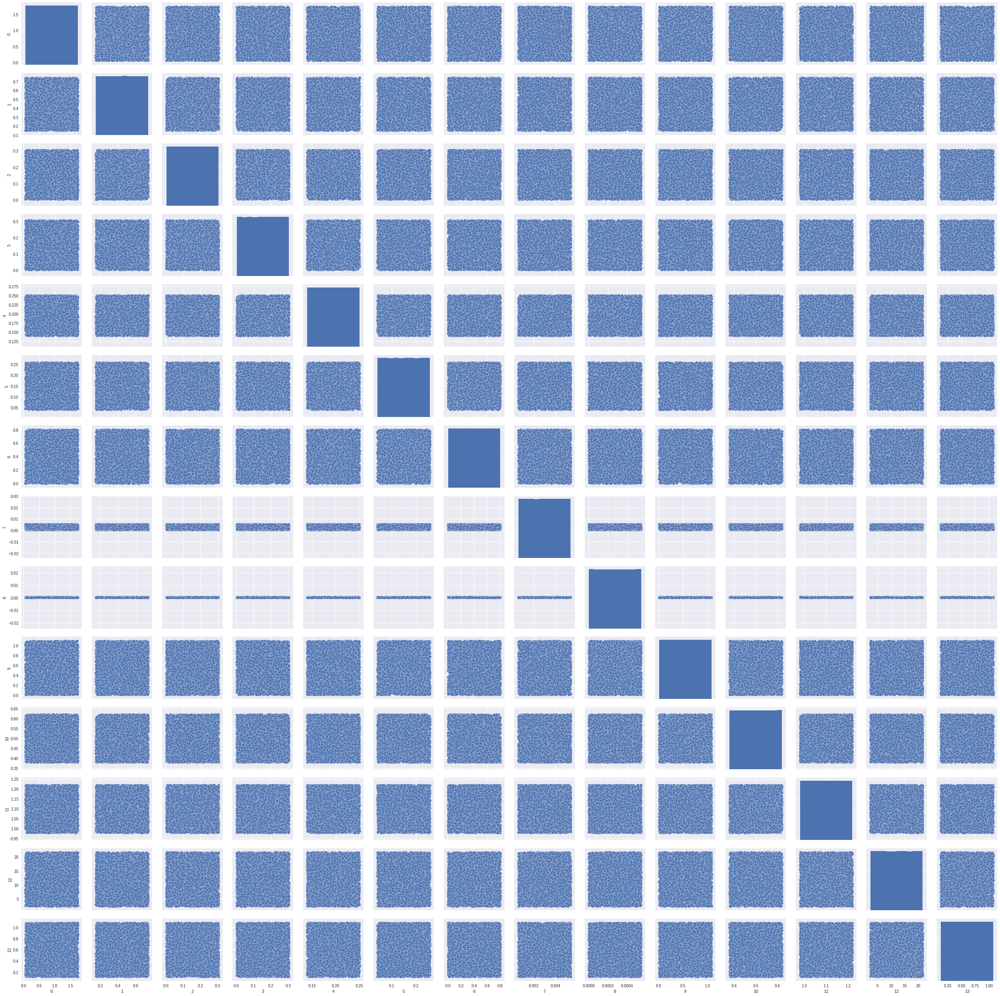

In [653]:
sns.pairplot(pd.DataFrame(param_values))

# py2west section

<font size=3> <b> use this for running a simulation on the eraser and then analize the results in the next sections

In [112]:
from __future__ import print_function, division # Python 3 printing and division

import pandas as pd
import numpy as np
import seaborn as sns
import os, shutil, glob
import py2WEST

from sklearn.utils.extmath import cartesian
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.ticker as plticker
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.cm as cm
import matplotlib.mlab as mlab
from matplotlib.mlab import griddata
%matplotlib inline

In [117]:
import ipyparallel as ipp
c = ipp.Client()

In [118]:
%%px --local
import subprocess                           # Run commands in bash
import signal                               # Needed to limit calculation time per simulation 
import shutil
import xml.etree.ElementTree as etxml
import lxml
import os
import py2WEST                              # imported as py2WEST; parse_xml file is saved in py2WEST folder as a package 
import dill
import pickle
from ipykernel import serialize
serialize.pickle = pickle

In [119]:
dview = c[:]                                    # Make directView of all clients, used to parse data/objects to cores
lview = c.load_balanced_view()             # Make balancedView of all clients, used for dynamic calculations

In [120]:
pywest_dir = './'
case_dir = '/home/data/gbelland/gitRepos/EHV_GSA/Eindhoven_n2o_CM/'
save_dir = '/home/data/gbelland/gitRepos/EHV_GSA/Eindhoven_n2o_CM/'

In [121]:
case_name = 'Eindhoven'
experiment_type = r"steady state"#r"dynamic"#
timeout_duration = 3000 #s
default_output = None

<font size=3> <b> N.B.: for global parameters insert the parameter name without point before it

In [122]:
parasets = pd.DataFrame(param_values, columns=columns)

In [123]:
scenario = []
for row in parasets.index:
    scenario.append([row, py2WEST.parse_xml.dframe_to_dict(parasets, row)])
scenario_len = len(scenario)
scenario

[[0,
  {'K_F1': 12.326306623646621,
   'K_FA': 0.0052668882565013973,
   'K_FNA': 0.00040216334919612252,
   'K_I9FA': 0.4131544042810556,
   'K_O1_BH': 0.89589212395318663,
   'K_OA1': 0.49409123854431891,
   'K_OA2': 1.146123810469178,
   'K_O_A1Lysis': 0.38134607621343358,
   'K_O_A2Lysis': 0.61132429273171274,
   'Y_A1': 0.16742904995800559,
   'Y_A2': 0.06258446891735249,
   'b_A1': 0.068075524670250326,
   'b_A2': 0.1346891591163914,
   'n_NOx_A1_d': 0.49980449401726623}],
 [1,
  {'K_F1': 8.7073343929885727,
   'K_FA': 0.0041757118084188253,
   'K_FNA': 0.00010454933645434917,
   'K_I9FA': 0.41206359238428708,
   'K_O1_BH': 0.45101176882676514,
   'K_OA1': 0.4508033895240311,
   'K_OA2': 1.0086714239198522,
   'K_O_A1Lysis': 1.449532944542443,
   'K_O_A2Lysis': 0.17254019375033808,
   'Y_A1': 0.19353369281477456,
   'Y_A2': 0.24958250574519436,
   'b_A1': 0.035960812664933318,
   'b_A2': 0.18408439345012267,
   'n_NOx_A1_d': 0.64446913239446679}],
 [2,
  {'K_F1': 16.1443855224863

In [124]:
out = lview.map_async(run_GSA, scenario, [case_dir]*scenario_len, [case_name]*scenario_len, [save_dir]*scenario_len,
                      [experiment_type]*scenario_len, [timeout_duration]*scenario_len)
#while out.progress != scenario_len:
#    continue
print('Done!')

Done!


In [38]:
out.progress

5000

In [39]:
#Lijst [scenario_id, success (1) or no succes (0)]
success = [row[1] for row in out.result()]
failed_scenarios = [i for i,x in enumerate(success) if x == 0]
print(failed_scenarios)
if len(failed_scenarios) != 0:
    print("Total of:", len(failed_scenarios))

[553, 1281, 1595, 3006, 3406, 4038, 4551]
Total of: 7


# show results and analysis with pystran

find a more efficient method to load and process these files

In [50]:
objective = pd.DataFrame({'.OUT_A.C(S_NH)': 1.01, '.OUT_A.C(S_O)': 1.02, '.OUT_A.C(X_TSS)': 3200}, index=[0])

In [52]:
results = reshape_files3('./results/metricEval/CM/StSt/',
                         'Eindhoven', 'Steady State', len(parasets), objective) # or Dynamic!
# for key in units.keys():
#     fig, ax = plt.subplots()
#     for column in results['#.t'].columns:
#         ax.plot(results['#.t'][column],results[key][column],label=column)
#         ax.set_title(key,fontsize=14)
#         ax.legend(results['#.t'].columns)

## metric evaluation

In [108]:
pd.to_pickle(parasets, './results/metricEval/CM/StSt/parasets')

### NH

In [56]:
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = pd.DataFrame(min_max_scaler.fit_transform(results['.OUT_A.C(S_NH)']), columns=results['.OUT_A.C(S_NH)'].columns)
x_scaled['sum'] = x_scaled.sum(axis=1)
x_scaled['scenario'] = x_scaled.index
x_scaled = x_scaled.set_index(x_scaled['sum']).sort_index()

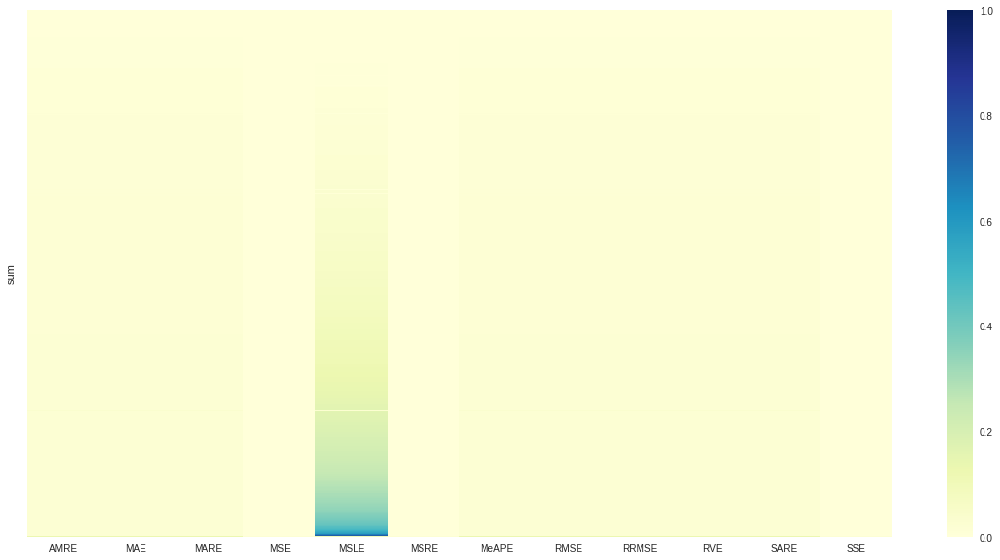

In [66]:
fig, ax1 = plt.subplots(figsize=(20, 10))
sns.heatmap(x_scaled[x_scaled.columns[0:12]], ax=ax1, annot=False, cmap="YlGnBu", )

# ax1.xaxis.set_major_locator(plt.MaxNLocator(nbins=13))
# ax1.set_xticklabels(df.columns.tolist()); # there is a bug in the set_ticklabels and the first label gets lost
ax1.set_yticklabels('')
plt.savefig(r'./results/metricEval/CM/StSt/rankscenario_nh.png', dpi=300)

In [67]:
threshold = 400
file_name = '%04d'%x_scaled['scenario'].iloc[threshold] + '_' + case_name + '.' + 'Steady State' + '.' + 'Simul.out.txt'
output = pd.read_csv(os.path.join('./results/metricEval/CM/StSt/', file_name), sep='\t')[-100:]
output['.OUT_A.C(S_NH)'].astype(float).mean()

0.7303528000000002

In [69]:
good = parasets.loc[x_scaled['scenario'].head(threshold).values[:]]
bad = parasets.loc[x_scaled['scenario'].tail(threshold).values[:]]
good['color'] = 'b'
bad['color'] = 'r'
good_bad_nh = pd.concat([good, bad])

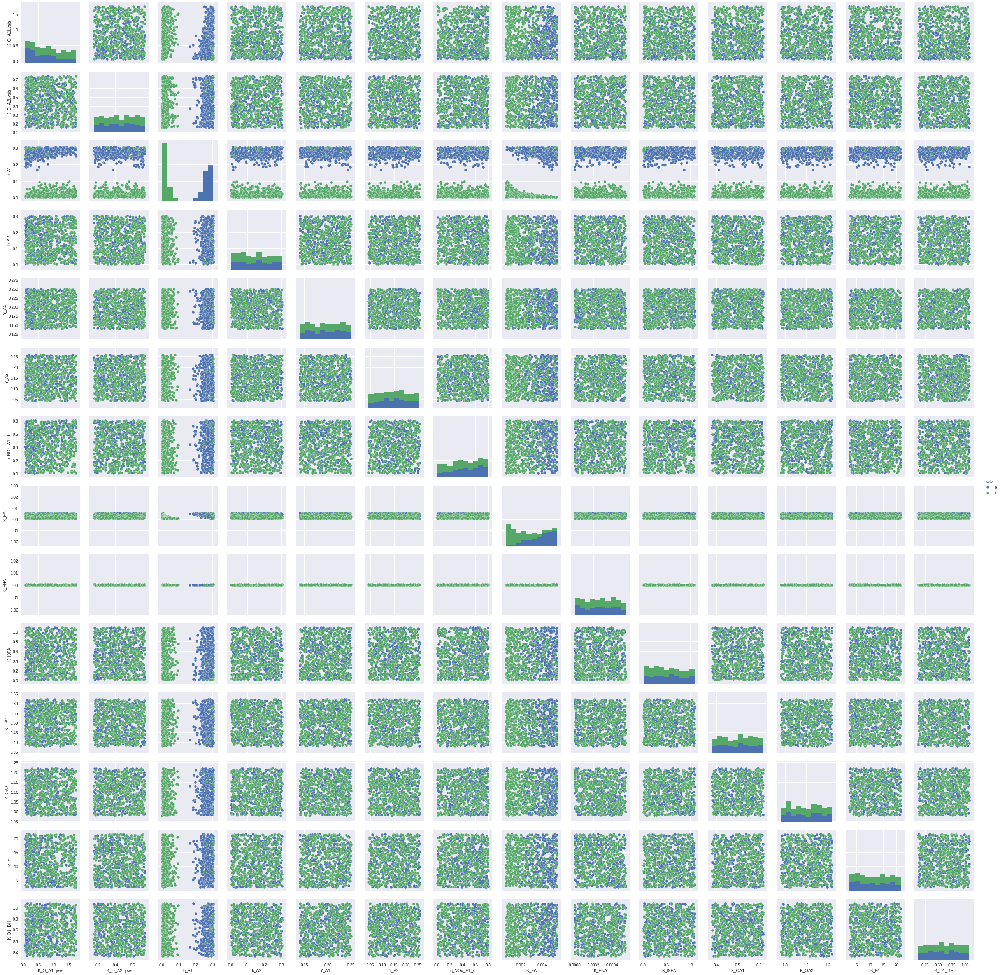

In [71]:
scat = sns.pairplot(good_bad_nh, hue='color')
scat.savefig(r'./results/metricEval/CM/StSt/pairplot_nh.png')#, dpi=300)

### DO


In [72]:
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = pd.DataFrame(min_max_scaler.fit_transform(results['.OUT_A.C(S_O)']), columns=results['.OUT_A.C(S_O)'].columns)
x_scaled['sum'] = x_scaled.sum(axis=1)
x_scaled['scenario'] = x_scaled.index
x_scaled = x_scaled.set_index(x_scaled['sum']).sort_index()

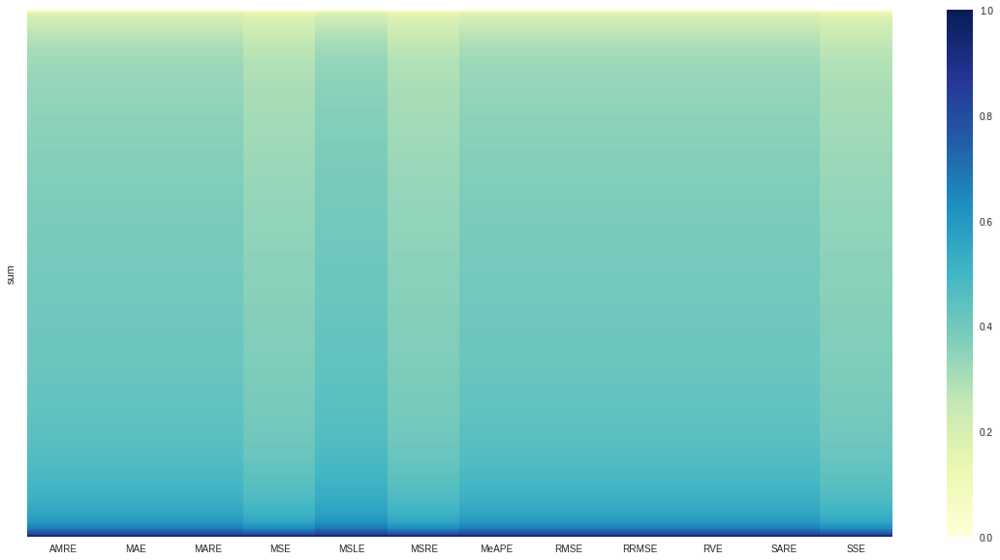

In [73]:
fig, ax1 = plt.subplots(figsize=(20, 10))
sns.heatmap(x_scaled[x_scaled.columns[0:12]], ax=ax1, annot=False, cmap="YlGnBu", )

# ax1.xaxis.set_major_locator(plt.MaxNLocator(nbins=13))
# ax1.set_xticklabels(df.columns.tolist()); # there is a bug in the set_ticklabels and the first label gets lost
ax1.set_yticklabels('')
plt.savefig(r'./results/metricEval/CM/StSt/rankscenario_do.png', dpi=300)

In [77]:
threshold = 100
file_name = '%04d'%x_scaled['scenario'].iloc[threshold] + '_' + case_name + '.' + 'Steady State' + '.' + 'Simul.out.txt'
output = pd.read_csv(os.path.join('./results/metricEval/CM/StSt/', file_name), sep='\t')[-100:]
output['.OUT_A.C(S_O)'].astype(float).mean()

5.791412699999995

In [78]:
good = parasets.loc[x_scaled['scenario'].head(threshold).values[:]]
bad = parasets.loc[x_scaled['scenario'].tail(threshold).values[:]]
good['color'] = 'b'
bad['color'] = 'r'
good_bad_do = pd.concat([good, bad])

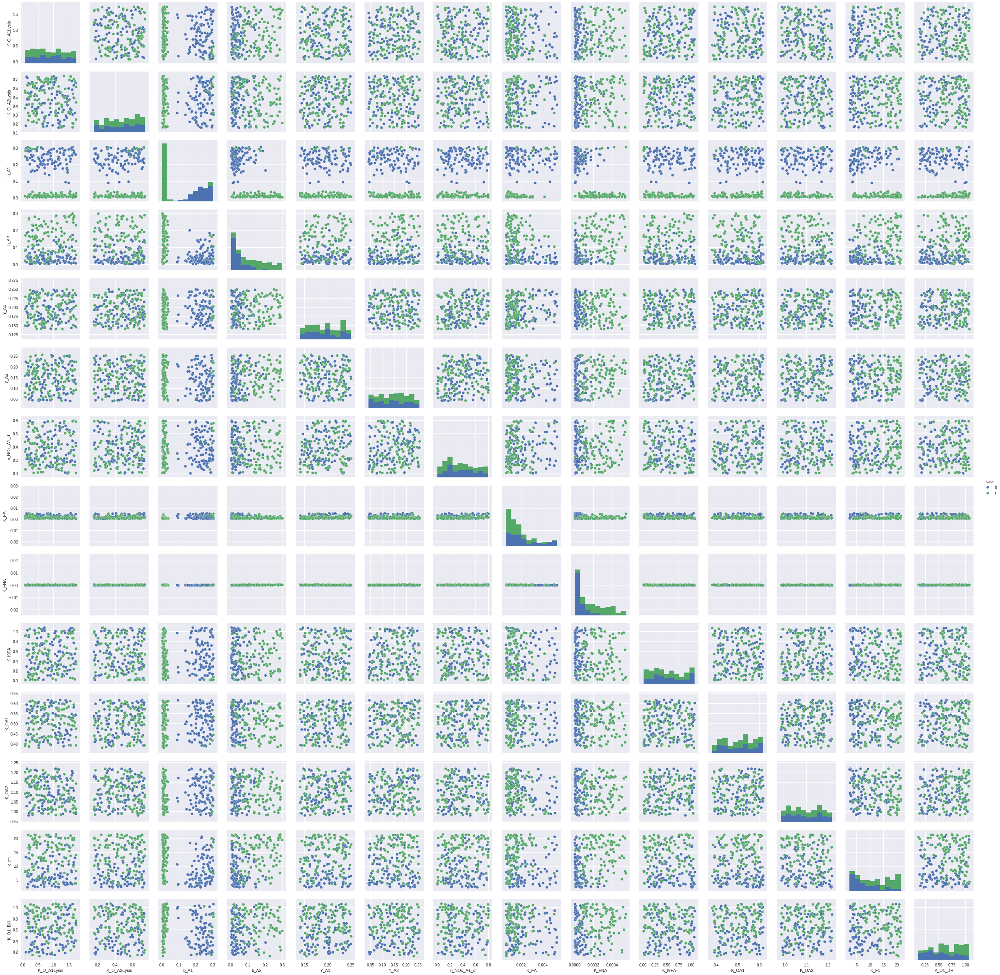

In [79]:
scat = sns.pairplot(good_bad_do, hue='color')
scat.savefig(r'./results/metricEval/CM/StSt/pairplot_do.png')#, dpi=300)

### TSS

In [80]:
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = pd.DataFrame(min_max_scaler.fit_transform(results['.OUT_A.C(X_TSS)']), columns=results['.OUT_A.C(X_TSS)'].columns)
x_scaled['sum'] = x_scaled.sum(axis=1)
x_scaled['scenario'] = x_scaled.index
x_scaled = x_scaled.set_index(x_scaled['sum']).sort_index()

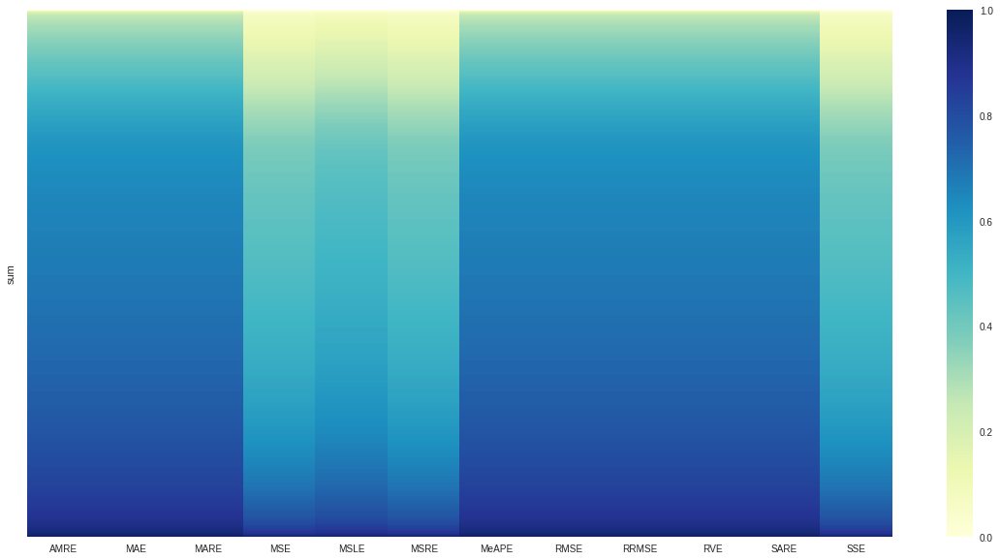

In [81]:
fig, ax1 = plt.subplots(figsize=(20, 10))
sns.heatmap(x_scaled[x_scaled.columns[0:12]], ax=ax1, annot=False, cmap="YlGnBu", )

# ax1.xaxis.set_major_locator(plt.MaxNLocator(nbins=13))
# ax1.set_xticklabels(df.columns.tolist()); # there is a bug in the set_ticklabels and the first label gets lost
ax1.set_yticklabels('')

plt.savefig(r'./results/metricEval/CM/StSt/rankscenario_tss.png', dpi=300)

In [87]:
threshold = 800
file_name = '%04d'%x_scaled['scenario'].iloc[threshold] + '_' + case_name + '.' + 'Steady State' + '.' + 'Simul.out.txt'
output = pd.read_csv(os.path.join('./results/metricEval/CM/StSt/', file_name), sep='\t')[-100:]
output['.OUT_A.C(X_TSS)'].astype(float).mean()

3712.847399999999

In [88]:
good = parasets.loc[x_scaled['scenario'].head(threshold).values[:]]
bad = parasets.loc[x_scaled['scenario'].tail(threshold).values[:]]
good['color'] = 'b'
bad['color'] = 'r'
good_bad_tss = pd.concat([good, bad])

In [ ]:
scat = sns.pairplot(good_bad_tss, hue='color')
scat.savefig(r'./results/metricEval/CM/StSt/pairplot_tss.png')#, dpi=300)

## Visualization of goo VS bad scenarios

In [ ]:
good_bad = pd.concat([good_bad_nh, good_bad_do, good_bad_tss])

In [ ]:
scat = sns.pairplot(good_bad, hue='color')
scat.savefig(r'./results/metricEval/CM/StSt/pairplot_all.png')#, dpi=300)

In [ ]:
scatter_matrix(good_bad, alpha=0.5, figsize=(16, 16), color=good_bad['color']);
plt.savefig(r'./results/metricEval/CM/StSt/pairplot_all2.png', dpi=300)

<font size=4> NOTA: crea una nuova sezione con nh DO e TSS e fai la stessa cosa di qui ma con le 10000 simulazioni <p/>
poi passa a dynamic e includi nell'output l'n2o liquido dall'ultimo scomparto anossico prima di entrare nel SP.